In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import random

# Define paths
generated_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imagenet/imgs"
masked_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/data/imagenet/image"
mask_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imagenet_gt/mask"
gt_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imagenet_gt/image"

print("Paths defined:")
print(f"Generated: {generated_path}")
print(f"Masked: {masked_path}")
print(f"Mask: {mask_path}")
print(f"GT: {gt_path}")

Paths defined:
Generated: /cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imagenet/imgs
Masked: /cluster/home/akmarala/Models/asuka-misato/asuka-flux/data/imagenet/image
Mask: /cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imagenet_gt/mask
GT: /cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imagenet_gt/image


In [3]:
# Check what files are available
def check_files(path, label):
    if os.path.exists(path):
        files = [f for f in os.listdir(path) if f.endswith(('.png', '.jpg', '.jpeg'))]
        print(f"{label}: {len(files)} files")
        if files:
            print(f"  Sample files: {files[:3]}")
        return files
    else:
        print(f"{label}: Directory does not exist!")
        return []

generated_files = check_files(generated_path, "Generated")
masked_files = check_files(masked_path, "Masked")
mask_files = check_files(mask_path, "Mask")
gt_files = check_files(gt_path, "GT")

# Find common files (intersection of all directories)
common_files = list(set(generated_files) & set(masked_files) & set(mask_files) & set(gt_files))
print(f"\nCommon files across all directories: {len(common_files)}")
if common_files:
    print(f"Sample common files: {common_files[:5]}")

Generated: 50 files
  Sample files: ['ILSVRC2012_val_00024327.png', 'ILSVRC2012_val_00021740.png', 'ILSVRC2012_val_00040833.png']
Masked: 50 files
  Sample files: ['ILSVRC2012_val_00024327.png', 'ILSVRC2012_val_00021740.png', 'ILSVRC2012_val_00040833.png']
Mask: 50 files
  Sample files: ['ILSVRC2012_val_00024327.png', 'ILSVRC2012_val_00021740.png', 'ILSVRC2012_val_00040833.png']
GT: 50 files
  Sample files: ['ILSVRC2012_val_00024327.png', 'ILSVRC2012_val_00021740.png', 'ILSVRC2012_val_00040833.png']

Common files across all directories: 50
Sample common files: ['ILSVRC2012_val_00000293.png', 'ILSVRC2012_val_00018317.png', 'ILSVRC2012_val_00025527.png', 'ILSVRC2012_val_00017699.png', 'ILSVRC2012_val_00037861.png']


Showing example: ILSVRC2012_val_00000293.png


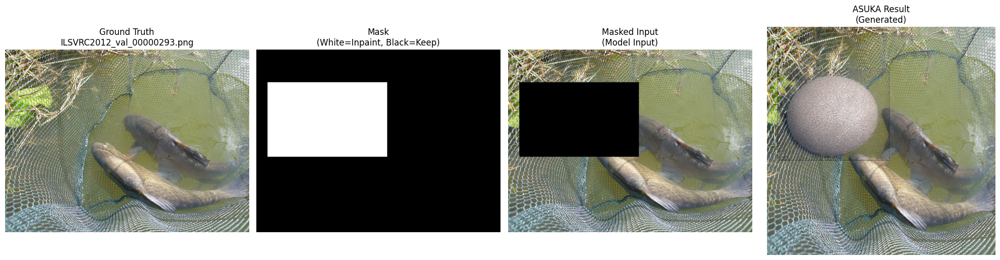

Mask coverage: 20.0% of image
Image size: (375, 500, 3)
------------------------------------------------------------


In [4]:
def visualize_inpainting_example(filename):
    """Visualize one example with all 4 components"""
    
    # Load all images
    generated_img = Image.open(os.path.join(generated_path, filename)).convert('RGB')
    masked_img = Image.open(os.path.join(masked_path, filename)).convert('RGB')
    mask_img = Image.open(os.path.join(mask_path, filename)).convert('L')
    gt_img = Image.open(os.path.join(gt_path, filename)).convert('RGB')
    
    # Convert to numpy arrays
    generated_np = np.array(generated_img)
    masked_np = np.array(masked_img)
    mask_np = np.array(mask_img)
    gt_np = np.array(gt_img)
    
    # Create visualization
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    # Ground Truth (Original)
    axes[0].imshow(gt_np)
    axes[0].set_title(f'Ground Truth\n{filename}', fontsize=12)
    axes[0].axis('off')
    
    # Mask
    axes[1].imshow(mask_np, cmap='gray')
    axes[1].set_title('Mask\n(White=Inpaint, Black=Keep)', fontsize=12)
    axes[1].axis('off')
    
    # Masked Input
    axes[2].imshow(masked_np)
    axes[2].set_title('Masked Input\n(Model Input)', fontsize=12)
    axes[2].axis('off')
    
    # Generated Result
    axes[3].imshow(generated_np)
    axes[3].set_title('ASUKA Result\n(Generated)', fontsize=12)
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print mask statistics
    mask_percentage = (mask_np > 128).sum() / mask_np.size * 100
    print(f"Mask coverage: {mask_percentage:.1f}% of image")
    print(f"Image size: {gt_np.shape}")
    print("-" * 60)

# Show a specific example
if common_files:
    example_file = common_files[0]
    print(f"Showing example: {example_file}")
    visualize_inpainting_example(example_file)
else:
    print("No common files found!")


=== Example 1/3: ILSVRC2012_val_00037383.png ===


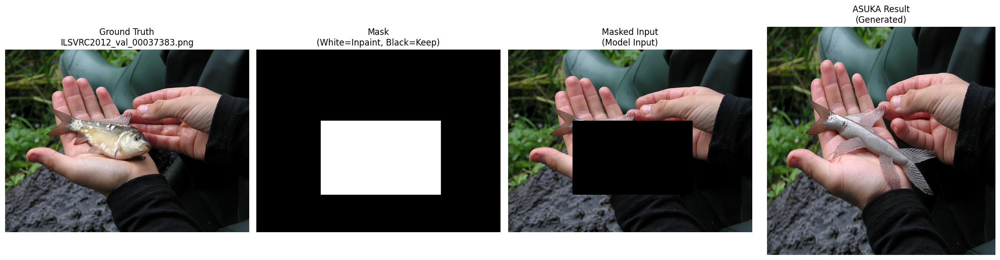

Mask coverage: 19.9% of image
Image size: (375, 500, 3)
------------------------------------------------------------

=== Example 2/3: ILSVRC2012_val_00037834.png ===


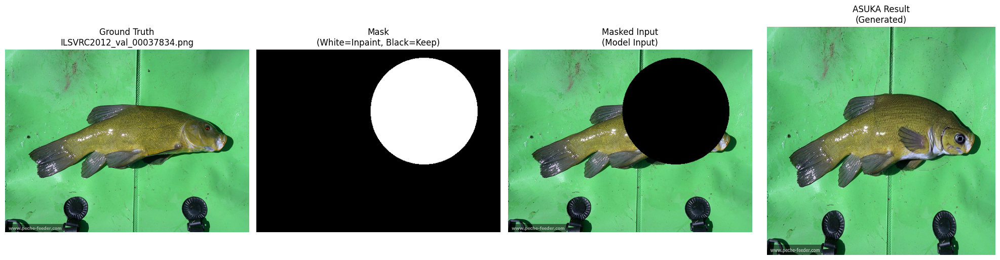

Mask coverage: 20.1% of image
Image size: (375, 500, 3)
------------------------------------------------------------

=== Example 3/3: ILSVRC2012_val_00007197.png ===


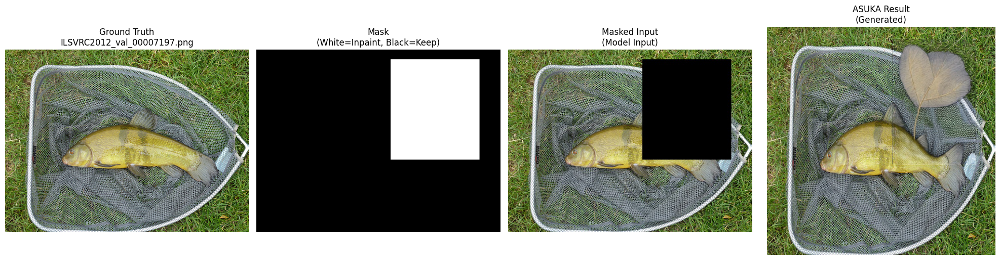

Mask coverage: 20.0% of image
Image size: (375, 500, 3)
------------------------------------------------------------


In [5]:
def visualize_random_examples(num_examples=3):
    """Show multiple random examples"""
    if len(common_files) < num_examples:
        num_examples = len(common_files)
        print(f"Only {num_examples} examples available")
    
    if num_examples == 0:
        print("No files to visualize!")
        return
    
    # Select random files
    selected_files = random.sample(common_files, num_examples)
    
    for i, filename in enumerate(selected_files):
        print(f"\n=== Example {i+1}/{num_examples}: {filename} ===")
        visualize_inpainting_example(filename)

# Show 3 random examples
visualize_random_examples(3)

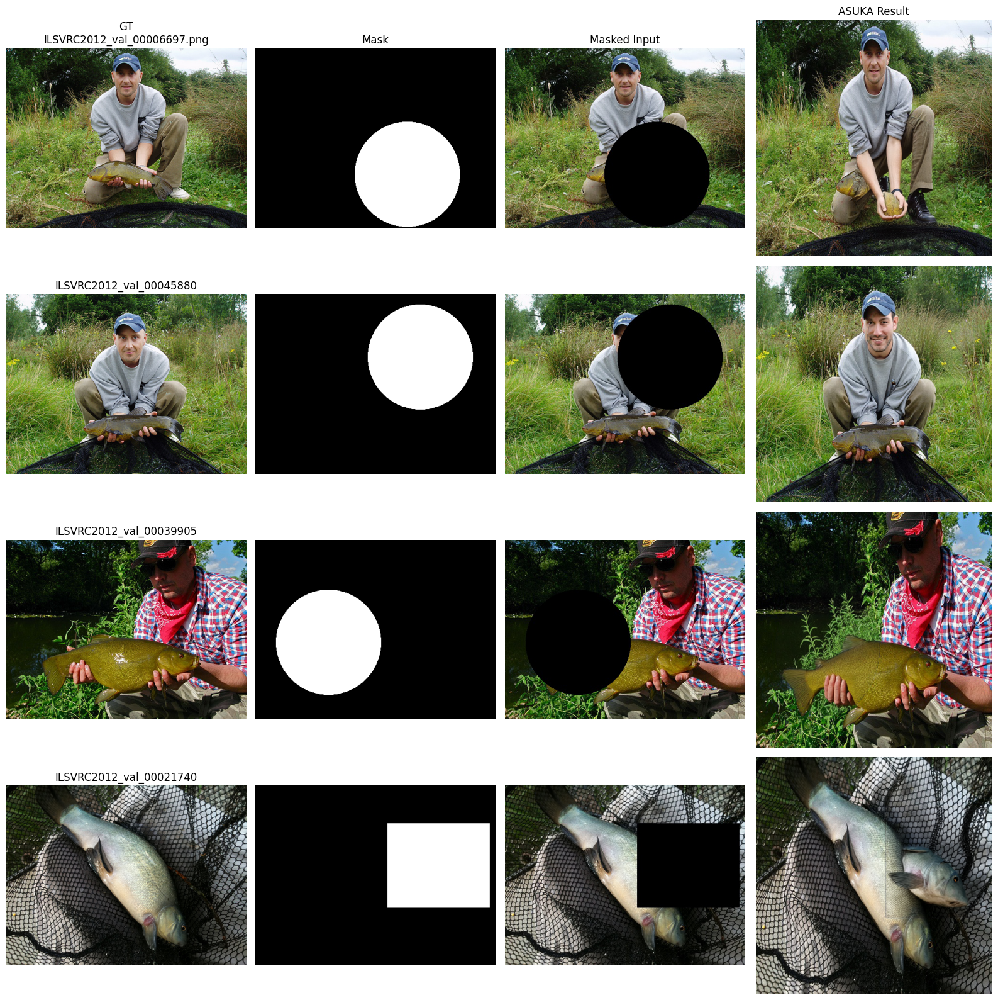

In [6]:
def create_comparison_grid(num_examples=6):
    """Create a grid comparison of multiple examples"""
    if len(common_files) < num_examples:
        num_examples = len(common_files)
    
    if num_examples == 0:
        print("No files to visualize!")
        return
    
    selected_files = random.sample(common_files, num_examples)
    
    # Create a grid: rows = examples, columns = [GT, Mask, Masked Input, Generated]
    fig, axes = plt.subplots(num_examples, 4, figsize=(16, 4*num_examples))
    
    if num_examples == 1:
        axes = axes.reshape(1, -1)
    
    for i, filename in enumerate(selected_files):
        # Load images
        gt_img = np.array(Image.open(os.path.join(gt_path, filename)).convert('RGB'))
        mask_img = np.array(Image.open(os.path.join(mask_path, filename)).convert('L'))
        masked_img = np.array(Image.open(os.path.join(masked_path, filename)).convert('RGB'))
        generated_img = np.array(Image.open(os.path.join(generated_path, filename)).convert('RGB'))
        
        # Plot images
        axes[i, 0].imshow(gt_img)
        axes[i, 0].set_title(f'GT\n{filename}' if i == 0 else filename.split('.')[0])
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask_img, cmap='gray')
        axes[i, 1].set_title('Mask' if i == 0 else '')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(masked_img)
        axes[i, 2].set_title('Masked Input' if i == 0 else '')
        axes[i, 2].axis('off')
        
        axes[i, 3].imshow(generated_img)
        axes[i, 3].set_title('ASUKA Result' if i == 0 else '')
        axes[i, 3].axis('off')
    
    plt.tight_layout()
    plt.show()

# Create a comparison grid
create_comparison_grid(4)

In [7]:
# Quick statistics about your results
print("=== Dataset Statistics ===")
print(f"Total common files: {len(common_files)}")

if common_files:
    # Check image sizes
    sample_file = common_files[0]
    sample_img = Image.open(os.path.join(gt_path, sample_file))
    print(f"Image size: {sample_img.size}")
    
    # Calculate average mask coverage
    mask_coverages = []
    for filename in common_files[:10]:  # Sample first 10 files
        mask_img = np.array(Image.open(os.path.join(mask_path, filename)).convert('L'))
        coverage = (mask_img > 128).sum() / mask_img.size * 100
        mask_coverages.append(coverage)
    
    print(f"Average mask coverage (sample): {np.mean(mask_coverages):.1f}%")
    print(f"Mask coverage range: {np.min(mask_coverages):.1f}% - {np.max(mask_coverages):.1f}%")

=== Dataset Statistics ===
Total common files: 50
Image size: (500, 375)
Average mask coverage (sample): 20.0%
Mask coverage range: 19.9% - 20.1%


Found 50 common files
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/cluster/home/akmarala/envs/asuka_env/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/cluster/home/akmarala/envs/asuka_env/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /cluster/home/akmarala/envs/asuka_env/lib/python3.11/site-packages/lpips/weights/v0.1/alex.pth


/cluster/home/akmarala/envs/asuka_env/lib/python3.11/site-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_pa

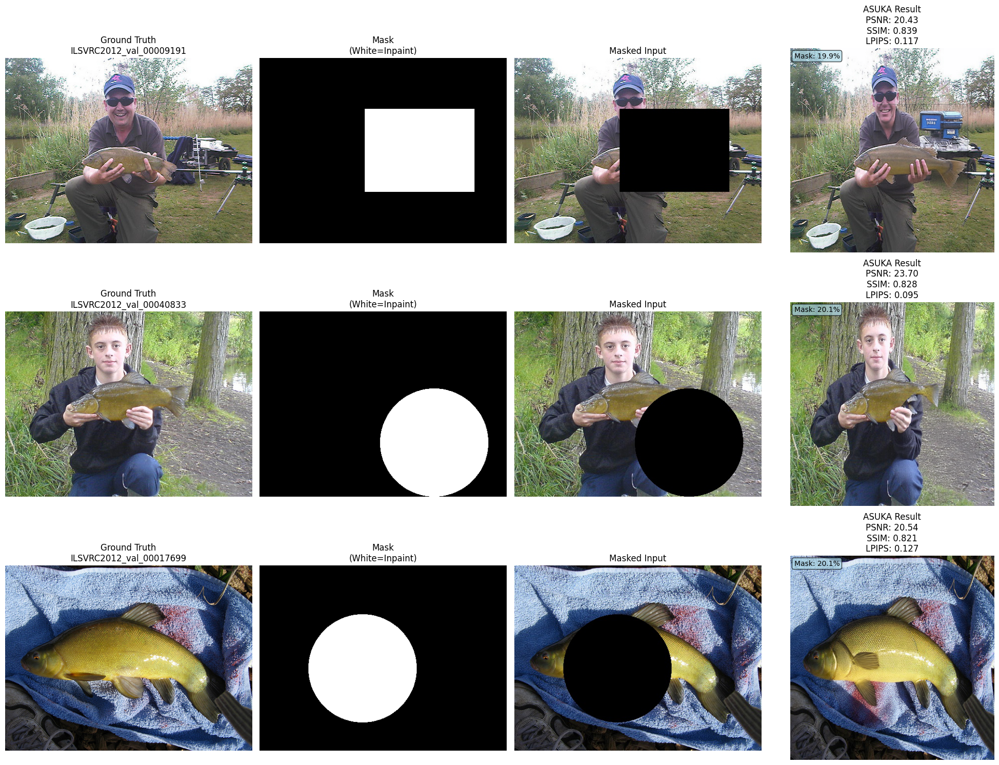

📊 OVERALL METRICS SUMMARY
🎯 PSNR: 21.555 (⚠️ Good)
📐 SSIM: 0.829 (✅ Excellent)
👁️ LPIPS: 0.113 (✅ Excellent)

📋 Reference Values (from paper):
   PSNR: 22.329 (ASUKA) | 22.194 (FLUX)
   SSIM: 0.805 (ASUKA) | 0.798 (FLUX)
   LPIPS: 0.141 (ASUKA) | 0.156 (FLUX)


In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import random
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from skimage.metrics import structural_similarity
import lpips

# Define paths
generated_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imagenet/imgs"
masked_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/data/imagenet/image"
mask_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imagenet_gt/mask"
gt_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imagenet_gt/image"

# Get common files
def get_common_files():
    generated_files = [f for f in os.listdir(generated_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    masked_files = [f for f in os.listdir(masked_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    mask_files = [f for f in os.listdir(mask_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    gt_files = [f for f in os.listdir(gt_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    return list(set(generated_files) & set(masked_files) & set(mask_files) & set(gt_files))

common_files = get_common_files()
print(f"Found {len(common_files)} common files")

# Initialize LPIPS model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
try:
    loss_fn_alex = lpips.LPIPS(net='alex').to(device)
except:
    print("LPIPS model not available, will skip LPIPS calculation")
    loss_fn_alex = None

def calculate_metrics_for_image(filename):
    """Calculate PSNR, SSIM, LPIPS for one image"""
    # Load images
    gt_img = Image.open(os.path.join(gt_path, filename)).convert('RGB')
    mask_img = Image.open(os.path.join(mask_path, filename)).convert('L')
    result_img = Image.open(os.path.join(generated_path, filename)).convert('RGB')
    
    # Resize to same size
    target_size = (512, 512)
    gt_img = gt_img.resize(target_size, Image.Resampling.LANCZOS)
    mask_img = mask_img.resize(target_size, Image.Resampling.NEAREST)
    result_img = result_img.resize(target_size, Image.Resampling.LANCZOS)
    
    # Convert to tensors
    gt_tensor = TF.to_tensor(gt_img).unsqueeze(0).to(device)
    mask_tensor = TF.to_tensor(mask_img).unsqueeze(0).to(device)
    result_tensor = TF.to_tensor(result_img).unsqueeze(0).to(device)
    
    # Create prediction (same logic as evaluation script)
    mask_binary = (mask_tensor >= 0.5).float()
    pred_tensor = result_tensor * mask_binary + gt_tensor * (1 - mask_binary)
    
    # Calculate PSNR
    mse = torch.mean((pred_tensor - gt_tensor) ** 2)
    psnr = -10 * torch.log10(mse + 1e-7)
    
    # Calculate SSIM
    pred_gray = TF.rgb_to_grayscale(pred_tensor)[0, 0].cpu().numpy()
    gt_gray = TF.rgb_to_grayscale(gt_tensor)[0, 0].cpu().numpy()
    ssim = structural_similarity(pred_gray, gt_gray, data_range=1.0)
    
    # Calculate LPIPS
    if loss_fn_alex is not None:
        pred_norm = pred_tensor * 2 - 1  # Scale to [-1, 1]
        gt_norm = gt_tensor * 2 - 1
        with torch.no_grad():
            lpips_score = loss_fn_alex(pred_norm, gt_norm).item()
    else:
        lpips_score = None
    
    return psnr.item(), ssim, lpips_score

def get_metric_color(metric_name, value):
    """Return color based on metric quality"""
    if value is None:
        return 'gray'
    
    if metric_name == 'PSNR':
        if value >= 22: return 'green'
        elif value >= 20: return 'orange'
        else: return 'red'
    elif metric_name == 'SSIM':
        if value >= 0.8: return 'green'
        elif value >= 0.7: return 'orange'
        else: return 'red'
    elif metric_name == 'LPIPS':
        if value <= 0.15: return 'green'
        elif value <= 0.2: return 'orange'
        else: return 'red'
    return 'black'

def visualize_with_metrics(num_examples=3):
    """Visualize examples with metrics calculation"""
    if len(common_files) < num_examples:
        num_examples = len(common_files)
    
    selected_files = random.sample(common_files, num_examples)
    
    # Create figure
    fig, axes = plt.subplots(num_examples, 4, figsize=(20, 5*num_examples))
    if num_examples == 1:
        axes = axes.reshape(1, -1)
    
    all_psnr = []
    all_ssim = []
    all_lpips = []
    
    for i, filename in enumerate(selected_files):
        # Calculate metrics
        psnr, ssim, lpips_score = calculate_metrics_for_image(filename)
        all_psnr.append(psnr)
        all_ssim.append(ssim)
        if lpips_score is not None:
            all_lpips.append(lpips_score)
        
        # Load images for visualization
        gt_img = np.array(Image.open(os.path.join(gt_path, filename)).convert('RGB'))
        mask_img = np.array(Image.open(os.path.join(mask_path, filename)).convert('L'))
        masked_img = np.array(Image.open(os.path.join(masked_path, filename)).convert('RGB'))
        generated_img = np.array(Image.open(os.path.join(generated_path, filename)).convert('RGB'))
        
        # Plot images
        axes[i, 0].imshow(gt_img)
        axes[i, 0].set_title(f'Ground Truth\n{filename.split(".")[0]}')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask_img, cmap='gray')
        axes[i, 1].set_title('Mask\n(White=Inpaint)')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(masked_img)
        axes[i, 2].set_title('Masked Input')
        axes[i, 2].axis('off')
        
        axes[i, 3].imshow(generated_img)
        
        # Create metrics text with colors
        metrics_text = f"PSNR: {psnr:.2f}\nSSIM: {ssim:.3f}"
        if lpips_score is not None:
            metrics_text += f"\nLPIPS: {lpips_score:.3f}"
        
        axes[i, 3].set_title(f'ASUKA Result\n{metrics_text}')
        axes[i, 3].axis('off')
        
        # Add colored text boxes for metrics
        mask_coverage = (mask_img > 128).sum() / mask_img.size * 100
        axes[i, 3].text(0.02, 0.98, f'Mask: {mask_coverage:.1f}%', 
                       transform=axes[i, 3].transAxes, fontsize=10,
                       bbox=dict(boxstyle="round,pad=0.3", facecolor='lightblue', alpha=0.7),
                       verticalalignment='top')
    
    plt.tight_layout()
    plt.show()
    
    # Calculate and display overall metrics with colors
    avg_psnr = np.mean(all_psnr)
    avg_ssim = np.mean(all_ssim)
    avg_lpips = np.mean(all_lpips) if all_lpips else None
    
    print("="*60)
    print("📊 OVERALL METRICS SUMMARY")
    print("="*60)
    
    # PSNR
    psnr_color = get_metric_color('PSNR', avg_psnr)
    print(f"🎯 PSNR: {avg_psnr:.3f} ({'✅ Excellent' if psnr_color=='green' else '⚠️ Good' if psnr_color=='orange' else '❌ Needs Improvement'})")
    
    # SSIM
    ssim_color = get_metric_color('SSIM', avg_ssim)
    print(f"📐 SSIM: {avg_ssim:.3f} ({'✅ Excellent' if ssim_color=='green' else '⚠️ Good' if ssim_color=='orange' else '❌ Needs Improvement'})")
    
    # LPIPS
    if avg_lpips is not None:
        lpips_color = get_metric_color('LPIPS', avg_lpips)
        print(f"👁️ LPIPS: {avg_lpips:.3f} ({'✅ Excellent' if lpips_color=='green' else '⚠️ Good' if lpips_color=='orange' else '❌ Needs Improvement'})")
    
    print("\n📋 Reference Values (from paper):")
    print("   PSNR: 22.329 (ASUKA) | 22.194 (FLUX)")
    print("   SSIM: 0.805 (ASUKA) | 0.798 (FLUX)")
    print("   LPIPS: 0.141 (ASUKA) | 0.156 (FLUX)")
    print("="*60)

# Run visualization with metrics
visualize_with_metrics(3)

Oseberg Paths:
Masked: /cluster/home/akmarala/Models/asuka-misato/asuka-flux/data/oseberg/image
Mask: /cluster/home/akmarala/Models/asuka-misato/asuka-flux/data/oseberg/mask
Generated: /cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imgs

Found 28 common files
Sample files: ['resized_104.png', 'resized_067.png', 'resized_071.png', 'resized_001.png', 'resized_082.png']

🎨 Visualizing 3 random Oseberg examples...


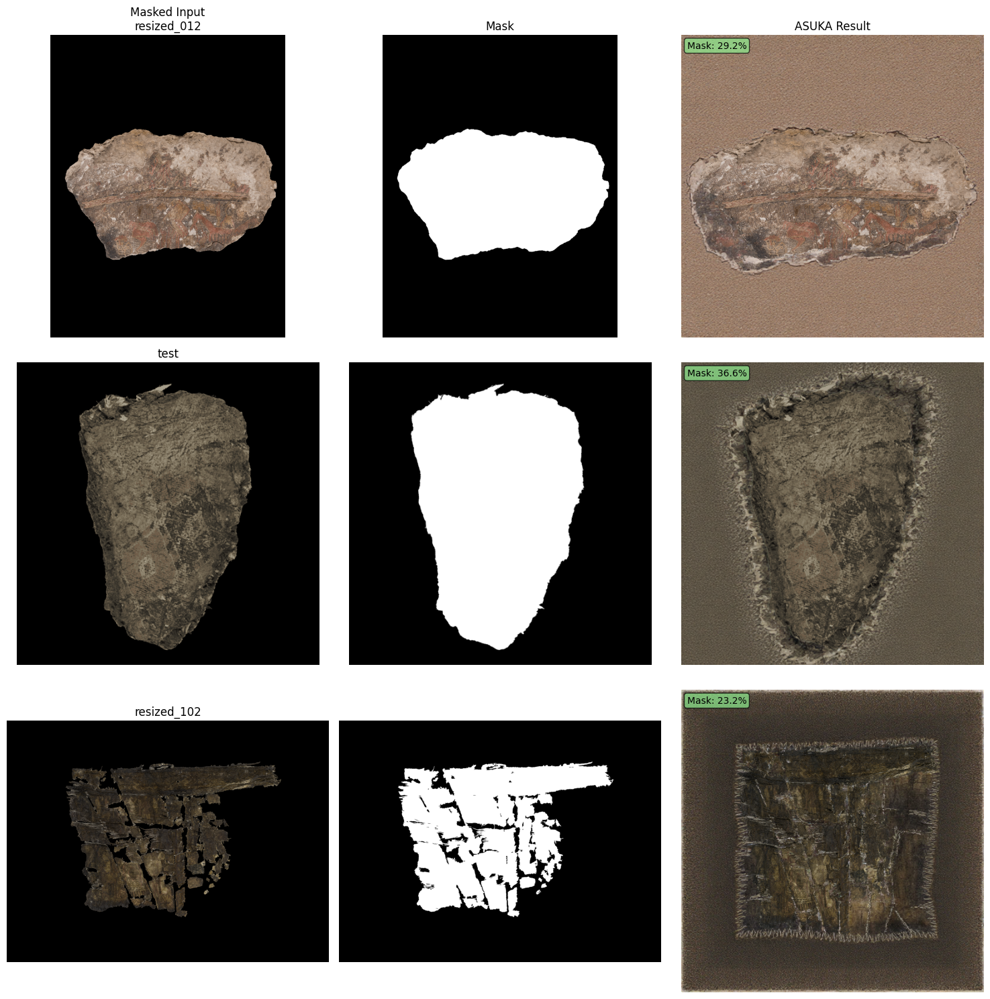

📊 OSEBERG DATASET SUMMARY
🗂️ Total files processed: 3
📏 Average mask coverage: 29.6%
📐 Mask coverage range: 23.2% - 36.6%
🖼️ Image size: (3490, 4653, 3)

💡 Note: No GT available for Oseberg - qualitative assessment only


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import random

# Define paths for Oseberg
masked_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/data/oseberg/image"
mask_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/data/oseberg/mask"
generated_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imgs"

print("Oseberg Paths:")
print(f"Masked: {masked_path}")
print(f"Mask: {mask_path}")
print(f"Generated: {generated_path}")

# Get common files
def get_common_files():
    masked_files = [f for f in os.listdir(masked_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    mask_files = [f for f in os.listdir(mask_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    generated_files = [f for f in os.listdir(generated_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    return list(set(masked_files) & set(mask_files) & set(generated_files))

common_files = get_common_files()
print(f"\nFound {len(common_files)} common files")
if common_files:
    print(f"Sample files: {common_files[:3]}")

def visualize_oseberg_example(filename):
    """Visualize one Oseberg example with 3 components (no GT)"""
    
    # Load all images
    masked_img = Image.open(os.path.join(masked_path, filename)).convert('RGB')
    mask_img = Image.open(os.path.join(mask_path, filename)).convert('L')
    generated_img = Image.open(os.path.join(generated_path, filename)).convert('RGB')
    
    # Convert to numpy arrays
    masked_np = np.array(masked_img)
    mask_np = np.array(mask_img)
    generated_np = np.array(generated_img)
    
    # Create visualization
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Masked Input
    axes[0].imshow(masked_np)
    axes[0].set_title(f'Masked Input\n{filename}', fontsize=14)
    axes[0].axis('off')
    
    # Mask
    axes[1].imshow(mask_np, cmap='gray')
    axes[1].set_title('Mask\n(White=Inpaint, Black=Keep)', fontsize=14)
    axes[1].axis('off')
    
    # Generated Result
    axes[2].imshow(generated_np)
    axes[2].set_title('ASUKA Result\n(Generated)', fontsize=14)
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print mask statistics
    mask_percentage = (mask_np > 128).sum() / mask_np.size * 100
    print(f"Mask coverage: {mask_percentage:.1f}% of image")
    print(f"Image size: {masked_np.shape}")
    print("-" * 60)

def visualize_oseberg_grid(num_examples=3):
    """Create a grid visualization of multiple Oseberg examples"""
    if len(common_files) < num_examples:
        num_examples = len(common_files)
        print(f"Only {num_examples} examples available")
    
    if num_examples == 0:
        print("No files to visualize!")
        return
    
    # Select random files
    selected_files = random.sample(common_files, num_examples)
    
    # Create figure
    fig, axes = plt.subplots(num_examples, 3, figsize=(15, 5*num_examples))
    if num_examples == 1:
        axes = axes.reshape(1, -1)
    
    for i, filename in enumerate(selected_files):
        # Load images
        masked_img = np.array(Image.open(os.path.join(masked_path, filename)).convert('RGB'))
        mask_img = np.array(Image.open(os.path.join(mask_path, filename)).convert('L'))
        generated_img = np.array(Image.open(os.path.join(generated_path, filename)).convert('RGB'))
        
        # Plot images
        axes[i, 0].imshow(masked_img)
        axes[i, 0].set_title(f'Masked Input\n{filename.split(".")[0]}' if i == 0 else filename.split(".")[0])
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask_img, cmap='gray')
        axes[i, 1].set_title('Mask' if i == 0 else '')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(generated_img)
        axes[i, 2].set_title('ASUKA Result' if i == 0 else '')
        axes[i, 2].axis('off')
        
        # Add mask coverage info
        mask_coverage = (mask_img > 128).sum() / mask_img.size * 100
        axes[i, 2].text(0.02, 0.98, f'Mask: {mask_coverage:.1f}%', 
                       transform=axes[i, 2].transAxes, fontsize=10,
                       bbox=dict(boxstyle="round,pad=0.3", facecolor='lightgreen', alpha=0.7),
                       verticalalignment='top')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print("="*50)
    print("📊 OSEBERG DATASET SUMMARY")
    print("="*50)
    print(f"🗂️ Total files processed: {len(selected_files)}")
    
    # Calculate mask coverage statistics
    mask_coverages = []
    for filename in selected_files:
        mask_img = np.array(Image.open(os.path.join(mask_path, filename)).convert('L'))
        coverage = (mask_img > 128).sum() / mask_img.size * 100
        mask_coverages.append(coverage)
    
    print(f"📏 Average mask coverage: {np.mean(mask_coverages):.1f}%")
    print(f"📐 Mask coverage range: {np.min(mask_coverages):.1f}% - {np.max(mask_coverages):.1f}%")
    print(f"🖼️ Image size: {masked_img.shape}")
    print("\n💡 Note: No GT available for Oseberg - qualitative assessment only")
    print("="*50)

# Run Oseberg visualization
if common_files:
    print(f"\n🎨 Visualizing {min(3, len(common_files))} random Oseberg examples...")
    visualize_oseberg_grid(3)
else:
    print("❌ No common files found across all directories!")

In [1]:
import os
import numpy as np
from PIL import Image

# Define paths
generated_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imagenet/imgs"
masked_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/data/imagenet/image"
oseberg_masked_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/data/oseberg/image"
oseberg_generated_path = "/cluster/home/akmarala/Models/asuka-misato/asuka-flux/logs/my_test/imgs"

def check_image_sizes(input_path, output_path, dataset_name):
    """Check and compare input vs output image sizes"""
    print(f"\n🔍 {dataset_name} IMAGE SIZE ANALYSIS")
    print("="*50)
    
    # Get common files
    input_files = [f for f in os.listdir(input_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    output_files = [f for f in os.listdir(output_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    common_files = list(set(input_files) & set(output_files))
    
    if not common_files:
        print("❌ No common files found!")
        return
    
    print(f"📁 Found {len(common_files)} common files")
    
    # Sample first 5 files to check sizes
    sample_files = common_files[:5]
    
    input_sizes = []
    output_sizes = []
    aspect_ratios_input = []
    aspect_ratios_output = []
    
    for filename in sample_files:
        # Load input and output images
        input_img = Image.open(os.path.join(input_path, filename))
        output_img = Image.open(os.path.join(output_path, filename))
        
        input_size = input_img.size  # (width, height)
        output_size = output_img.size
        
        input_sizes.append(input_size)
        output_sizes.append(output_size)
        
        # Calculate aspect ratios
        input_aspect = input_size[0] / input_size[1]  # width/height
        output_aspect = output_size[0] / output_size[1]
        
        aspect_ratios_input.append(input_aspect)
        aspect_ratios_output.append(output_aspect)
        
        print(f"📷 {filename}")
        print(f"   Input:  {input_size[0]}x{input_size[1]} (aspect: {input_aspect:.2f})")
        print(f"   Output: {output_size[0]}x{output_size[1]} (aspect: {output_aspect:.2f})")
        
        if input_size != output_size:
            print(f"   ⚠️  SIZE CHANGED!")
        if abs(input_aspect - output_aspect) > 0.1:
            print(f"   ⚠️  ASPECT RATIO CHANGED!")
        print()
    
    # Summary statistics
    print("📊 SUMMARY:")
    unique_input_sizes = list(set(input_sizes))
    unique_output_sizes = list(set(output_sizes))
    
    print(f"🔹 Input sizes: {unique_input_sizes}")
    print(f"🔹 Output sizes: {unique_output_sizes}")
    print(f"🔹 Average input aspect ratio: {np.mean(aspect_ratios_input):.2f}")
    print(f"🔹 Average output aspect ratio: {np.mean(aspect_ratios_output):.2f}")
    
    if len(unique_output_sizes) == 1:
        print(f"✅ All outputs have same size: {unique_output_sizes[0]}")
    else:
        print(f"⚠️  Multiple output sizes detected!")

# Check ImageNet results
check_image_sizes(masked_path, generated_path, "IMAGENET")

# Check Oseberg results  
check_image_sizes(oseberg_masked_path, oseberg_generated_path, "OSEBERG")


🔍 IMAGENET IMAGE SIZE ANALYSIS
📁 Found 50 common files
📷 ILSVRC2012_val_00009396.png
   Input:  500x375 (aspect: 1.33)
   Output: 512x512 (aspect: 1.00)
   ⚠️  SIZE CHANGED!
   ⚠️  ASPECT RATIO CHANGED!

📷 ILSVRC2012_val_00029930.png
   Input:  500x375 (aspect: 1.33)
   Output: 512x512 (aspect: 1.00)
   ⚠️  SIZE CHANGED!
   ⚠️  ASPECT RATIO CHANGED!

📷 ILSVRC2012_val_00024235.png
   Input:  500x375 (aspect: 1.33)
   Output: 512x512 (aspect: 1.00)
   ⚠️  SIZE CHANGED!
   ⚠️  ASPECT RATIO CHANGED!

📷 ILSVRC2012_val_00000293.png
   Input:  500x375 (aspect: 1.33)
   Output: 512x512 (aspect: 1.00)
   ⚠️  SIZE CHANGED!
   ⚠️  ASPECT RATIO CHANGED!

📷 ILSVRC2012_val_00037834.png
   Input:  500x375 (aspect: 1.33)
   Output: 512x512 (aspect: 1.00)
   ⚠️  SIZE CHANGED!
   ⚠️  ASPECT RATIO CHANGED!

📊 SUMMARY:
🔹 Input sizes: [(500, 375)]
🔹 Output sizes: [(512, 512)]
🔹 Average input aspect ratio: 1.33
🔹 Average output aspect ratio: 1.00
✅ All outputs have same size: (512, 512)

🔍 OSEBERG IMAGE SI

In [7]:
import os
from PIL import Image

# Define your new paths
base_path = "/cluster/home/akmarala/data/inpainting-exp/irregular_masking_results"
masked_images_path = os.path.join(base_path, "masked_images")
generated_masks_path = os.path.join(base_path, "generated_masks")

print("🔍 QUICK PATH & IMAGE VERIFICATION")
print("="*50)

# Check if directories exist
print(f"📁 Base path exists: {os.path.exists(base_path)}")
print(f"📁 Masked images path exists: {os.path.exists(masked_images_path)}")
print(f"📁 Generated masks path exists: {os.path.exists(generated_masks_path)}")

if os.path.exists(masked_images_path) and os.path.exists(generated_masks_path):
    # Count files
    masked_files = [f for f in os.listdir(masked_images_path) if f.endswith(('.png', '.jpg', '.JPEG'))]
    mask_files = [f for f in os.listdir(generated_masks_path) if f.endswith(('.png', '.jpg', '.JPEG'))]
    
    print(f"\n📊 FILE COUNTS:")
    print(f"   Masked images: {len(masked_files)}")
    print(f"   Generated masks: {len(mask_files)}")
    
    # Check for common files
    common_files = list(set(masked_files) & set(mask_files))
    print(f"   Common files: {len(common_files)}")
    
    if common_files:
        # Quick size check on first file
        sample_file = common_files[0]
        
        masked_img = Image.open(os.path.join(masked_images_path, sample_file))
        mask_img = Image.open(os.path.join(generated_masks_path, sample_file))
        
        print(f"\n📷 SAMPLE FILE: {sample_file}")
        print(f"   Masked image size: {masked_img.size}")
        print(f"   Mask size: {mask_img.size}")
        print(f"   Sizes match: {masked_img.size == mask_img.size}")
        
        print(f"\n✅ READY FOR INFERENCE!")
        print(f"📋 Sample files: {common_files[:3]}")
    else:
        print("\n❌ No matching files found!")
else:
    print("\n❌ One or both directories don't exist!")

🔍 QUICK PATH & IMAGE VERIFICATION
📁 Base path exists: True
📁 Masked images path exists: True
📁 Generated masks path exists: True

📊 FILE COUNTS:
   Masked images: 1000
   Generated masks: 1000
   Common files: 0

❌ No matching files found!


In [8]:
import os
from PIL import Image

# Define your new paths
base_path = "/cluster/home/akmarala/data/inpainting-exp/irregular_masking_results"
masked_images_path = os.path.join(base_path, "masked_images")
generated_masks_path = os.path.join(base_path, "generated_masks")

print("🔍 DETAILED DIRECTORY ANALYSIS")
print("="*50)

def check_all_files(directory_path, label):
    """Check all files including different extensions"""
    if not os.path.exists(directory_path):
        print(f"❌ {label}: Directory does not exist!")
        return
    
    all_files = os.listdir(directory_path)
    print(f"\n📁 {label}:")
    print(f"   Total files: {len(all_files)}")
    
    # Group by extension
    extensions = {}
    for file in all_files:
        ext = os.path.splitext(file)[1].lower()
        if ext not in extensions:
            extensions[ext] = []
        extensions[ext].append(file)
    
    for ext, files in extensions.items():
        print(f"   {ext if ext else 'no extension'}: {len(files)} files")
        if files:
            print(f"      Sample: {files[:3]}")

# Check both directories in detail
check_all_files(masked_images_path, "MASKED IMAGES")
check_all_files(generated_masks_path, "GENERATED MASKS")

# Now check for image files with more extensions
print(f"\n🖼️ IMAGE FILE ANALYSIS:")
image_extensions = ['.png', '.jpg', '.jpeg', '.bmp', '.tiff', '.tif', '.webp']

masked_images = []
mask_images = []

for root, dirs, files in os.walk(masked_images_path):
    for file in files:
        if any(file.lower().endswith(ext) for ext in image_extensions):
            masked_images.append(file)

for root, dirs, files in os.walk(generated_masks_path):
    for file in files:
        if any(file.lower().endswith(ext) for ext in image_extensions):
            mask_images.append(file)

print(f"   Masked images (all formats): {len(masked_images)}")
print(f"   Mask images (all formats): {len(mask_images)}")

if masked_images:
    print(f"   Sample masked files: {masked_images[:3]}")
if mask_images:
    print(f"   Sample mask files: {mask_images[:3]}")

# Check for common files
common_files = list(set(masked_images) & set(mask_images))
print(f"   Common files: {len(common_files)}")

if common_files:
    print(f"   Sample common: {common_files[:3]}")
    print(f"\n✅ Found matching files!")
else:
    print(f"\n❌ No matching files found!")
    if masked_images and mask_images:
        print("   Files exist in both directories but names don't match")
        print("   This might be a naming convention issue")

🔍 DETAILED DIRECTORY ANALYSIS

📁 MASKED IMAGES:
   Total files: 1000
   .jpeg: 1000 files
      Sample: ['ILSVRC2012_val_00046392.JPEG', 'ILSVRC2012_val_00039678.JPEG', 'ILSVRC2012_val_00031717.JPEG']

📁 GENERATED MASKS:
   Total files: 1000
   .png: 1000 files
      Sample: ['ILSVRC2012_val_00014817_mask.png', 'ILSVRC2012_val_00047310_mask.png', 'ILSVRC2012_val_00042214_mask.png']

🖼️ IMAGE FILE ANALYSIS:
   Masked images (all formats): 1000
   Mask images (all formats): 1000
   Sample masked files: ['ILSVRC2012_val_00046392.JPEG', 'ILSVRC2012_val_00039678.JPEG', 'ILSVRC2012_val_00031717.JPEG']
   Sample mask files: ['ILSVRC2012_val_00014817_mask.png', 'ILSVRC2012_val_00047310_mask.png', 'ILSVRC2012_val_00042214_mask.png']
   Common files: 0

❌ No matching files found!
   Files exist in both directories but names don't match
   This might be a naming convention issue


In [9]:
import os
from PIL import Image
import re

# Define your new paths
base_path = "/cluster/home/akmarala/data/inpainting-exp/irregular_masking_results"
masked_images_path = os.path.join(base_path, "masked_images")
generated_masks_path = os.path.join(base_path, "generated_masks")

print("🔍 FIXED FILENAME MATCHING")
print("="*50)

def extract_base_filename(filename):
    """Extract base filename without extension and suffixes"""
    # Remove extension
    base = os.path.splitext(filename)[0]
    # Remove _mask suffix if present
    base = re.sub(r'_mask$', '', base)
    return base

def find_matching_files():
    """Find matching files between directories with different naming patterns"""
    
    # Get all files
    masked_files = [f for f in os.listdir(masked_images_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    mask_files = [f for f in os.listdir(generated_masks_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    print(f"📁 Masked images: {len(masked_files)} files")
    print(f"📁 Mask files: {len(mask_files)} files")
    
    # Create mapping of base filename to full filename
    masked_mapping = {}
    mask_mapping = {}
    
    for f in masked_files:
        base = extract_base_filename(f)
        masked_mapping[base] = f
    
    for f in mask_files:
        base = extract_base_filename(f)
        mask_mapping[base] = f
    
    # Find common base filenames
    common_bases = set(masked_mapping.keys()) & set(mask_mapping.keys())
    
    print(f"\n🔗 MATCHING RESULTS:")
    print(f"   Base filenames in masked: {len(masked_mapping)}")
    print(f"   Base filenames in masks: {len(mask_mapping)}")
    print(f"   Common base filenames: {len(common_bases)}")
    
    if len(common_bases) > 0:
        # Show some examples
        sample_bases = list(common_bases)[:3]
        print(f"\n📋 SAMPLE MATCHES:")
        for base in sample_bases:
            masked_file = masked_mapping[base]
            mask_file = mask_mapping[base]
            print(f"   {base}:")
            print(f"     Masked: {masked_file}")
            print(f"     Mask:   {mask_file}")
        
        return [(masked_mapping[base], mask_mapping[base]) for base in common_bases]
    else:
        print(f"\n❌ Still no matches found!")
        print(f"Sample masked bases: {list(masked_mapping.keys())[:3]}")
        print(f"Sample mask bases: {list(mask_mapping.keys())[:3]}")
        return []

# Find matching files
matching_pairs = find_matching_files()

if matching_pairs:
    print(f"\n✅ SUCCESS! Found {len(matching_pairs)} matching pairs")
    
    # Quick size check on first pair
    masked_file, mask_file = matching_pairs[0]
    
    masked_img = Image.open(os.path.join(masked_images_path, masked_file))
    mask_img = Image.open(os.path.join(generated_masks_path, mask_file))
    
    print(f"\n📷 SAMPLE PAIR:")
    print(f"   Masked: {masked_file} - {masked_img.size}")
    print(f"   Mask:   {mask_file} - {mask_img.size}")
    print(f"   Sizes match: {masked_img.size == mask_img.size}")
    
    print(f"\n🚀 READY FOR MODEL INFERENCE!")
else:
    print(f"\n❌ No matching pairs found - need to investigate naming pattern")

🔍 FIXED FILENAME MATCHING
📁 Masked images: 1000 files
📁 Mask files: 1000 files

🔗 MATCHING RESULTS:
   Base filenames in masked: 1000
   Base filenames in masks: 1000
   Common base filenames: 1000

📋 SAMPLE MATCHES:
   ILSVRC2012_val_00048624:
     Masked: ILSVRC2012_val_00048624.JPEG
     Mask:   ILSVRC2012_val_00048624_mask.png
   ILSVRC2012_val_00007326:
     Masked: ILSVRC2012_val_00007326.JPEG
     Mask:   ILSVRC2012_val_00007326_mask.png
   ILSVRC2012_val_00000113:
     Masked: ILSVRC2012_val_00000113.JPEG
     Mask:   ILSVRC2012_val_00000113_mask.png

✅ SUCCESS! Found 1000 matching pairs

📷 SAMPLE PAIR:
   Masked: ILSVRC2012_val_00048624.JPEG - (414, 500)
   Mask:   ILSVRC2012_val_00048624_mask.png - (414, 500)
   Sizes match: True

🚀 READY FOR MODEL INFERENCE!


/cluster/home/akmarala/envs/asuka_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


ImportError: cannot import name 'FluxInpaintPipeline' from 'diffusers' (/cluster/home/akmarala/envs/asuka_env/lib/python3.11/site-packages/diffusers/__init__.py)